In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os                        
import pandas as pd  
from PIL import Image

In [3]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import layers, models
from tensorflow.keras.layers import Conv2D, Flatten, Dense, AvgPool2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator 

#from tensorflow.keras.applications.resnet import ResNet50
#from tensorflow.keras.applications.resnet import ResNet101
#from tensorflow.keras.applications.resnet import ResNet152

from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.applications.efficientnet import decode_predictions

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [4]:
batch_size = 32
img_height = 256
img_width = 256

In [5]:
# way to dataset
new_path = '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/_Mos_arch_final_folder/'
csv_path = new_path + 'csv_path_11_classes.csv'

# Looking on dataset

In [6]:
# rgb (loading in rgb)
labels = pd.read_csv(csv_path)
#train_datagen = ImageDataGenerator(preprocessing_function=tf.image.rgb_to_grayscale, rescale=1./255)
train_datagen = ImageDataGenerator(rescale=1./255,
    rotation_range=0.1,
 #   width_shift_range=0.2,
 #   height_shift_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    brightness_range=[0.7, 1.2])

train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=labels,
    #    directory='/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/Mos_Arch_dataset/',
        x_col='image_path',
        y_col='target_col',
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='sparse',
        seed=12345) 

Found 3001 validated image filenames belonging to 11 classes.


In [7]:
# class names
class_names_pic = list(train_gen_flow.class_indices.keys())
class_names_pic

['Brutalism',
 'Church',
 'Classicism',
 'Constructivism',
 'Fortification',
 'Industrial_XIX',
 'Modern',
 'Palaty',
 'Panelka',
 'Socialist_classicism',
 'XXI_century']

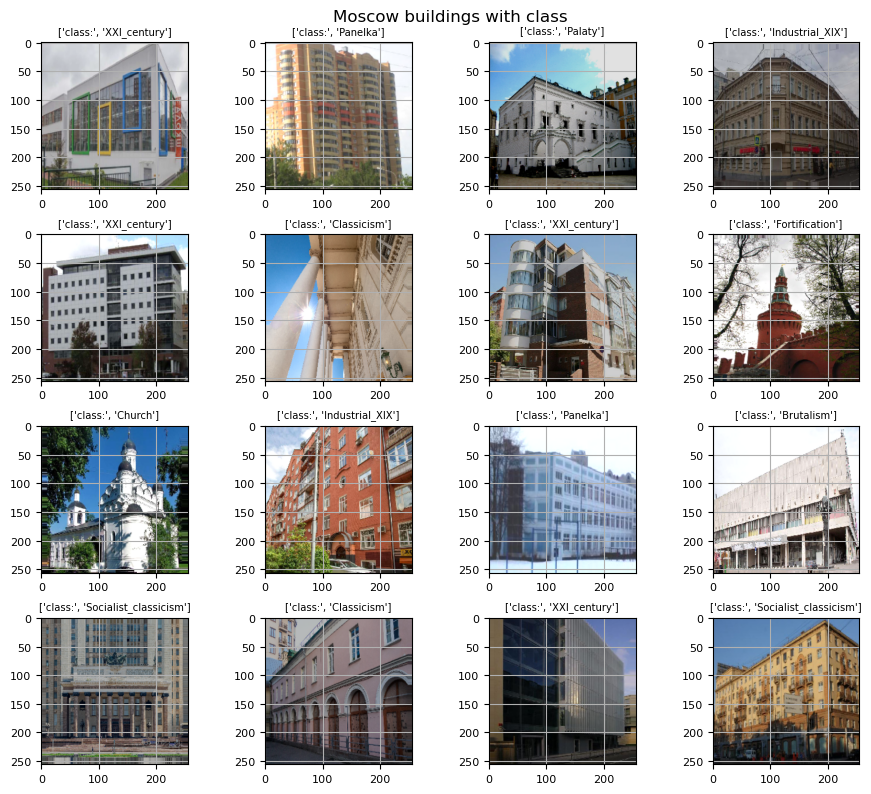

In [8]:
features, target = next(train_gen_flow)

fig = plt.figure(figsize=(10, 8))
plt.suptitle('Moscow buildings with class', size=12)

plt.rc('font', size=6) 
plt.rc('xtick', labelsize=8)    
plt.rc('ytick', labelsize=8) 

for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks()
    plt.yticks()
    plt.grid()
    plt.title(['class:', class_names_pic[int(target[i])]])
    plt.tight_layout()

In [9]:
# grayscale (loading as grayscale in fitting this way will be used)
labels = pd.read_csv(csv_path)
train_datagen = ImageDataGenerator(preprocessing_function=tf.image.rgb_to_grayscale, rescale=1./255,
#train_datagen = ImageDataGenerator(rescale=1./255,
    rotation_range=0.1,
 #   width_shift_range=0.2,
 #   height_shift_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    brightness_range=[0.7, 1.2])
train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=labels,
        directory='/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/Mos_Arch_dataset/',
        x_col='image_path',
        y_col='target_col',
        target_size=(img_height, img_width),
        batch_size=batch_size,
        class_mode='sparse',
        seed=12345) 

Found 3001 validated image filenames belonging to 11 classes.


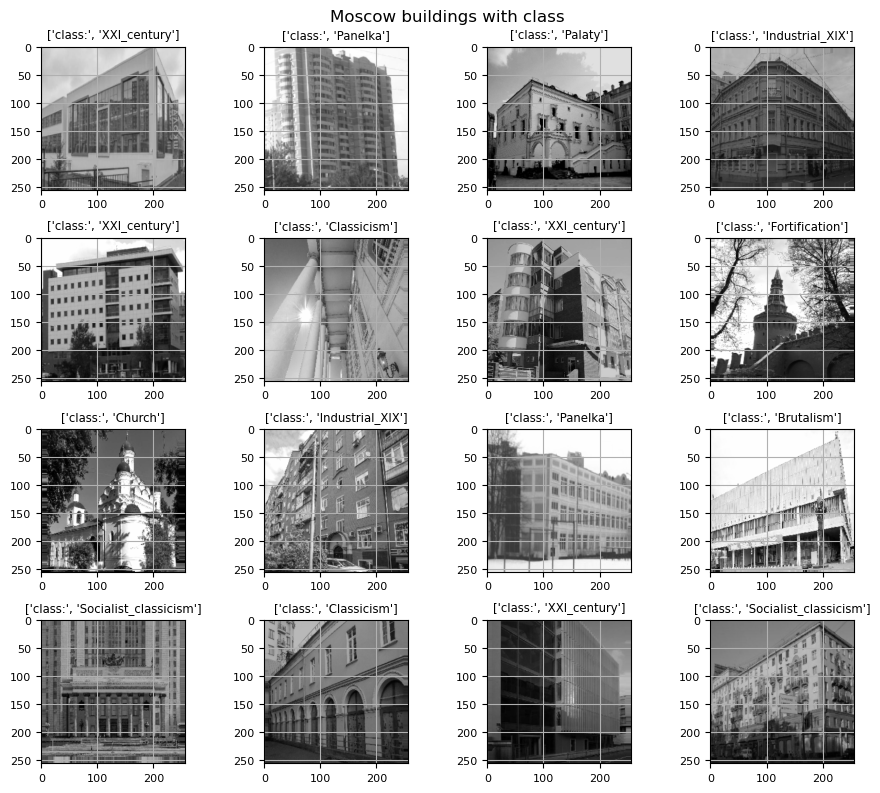

In [10]:
features, target = next(train_gen_flow)

fig = plt.figure(figsize=(10, 8))
plt.suptitle('Moscow buildings with class', size=12)

plt.rc('font', size=7) 
plt.rc('xtick', labelsize=8)    
plt.rc('ytick', labelsize=8) 

for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks()
    plt.yticks()
    plt.grid()
    plt.title(['class:', class_names_pic[int(target[i])]])
    plt.tight_layout()

# Data generator to model

In [11]:
batch_size = 32
img_height = 256
img_width = 256

In [12]:
# grayscale
labels = pd.read_csv(csv_path)

train_datagen = ImageDataGenerator(preprocessing_function=tf.image.rgb_to_grayscale, validation_split = 0.15,
#train_datagen = ImageDataGenerator(validation_split = 0.2,                                   
    rotation_range=0.1,
#    width_shift_range=0.2,
#    height_shift_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=False,
    brightness_range=[0.7, 1.2],
    rescale=1./255)


train_dg = train_datagen.flow_from_dataframe(
        dataframe=labels,
    #    directory='/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/Mos_Arch_dataset/',
        x_col='image_path',
        y_col='target_col',
        batch_size=batch_size,
        target_size=(img_height, img_width),
        class_mode='sparse',
        subset='training',
        seed=12345,
        shuffle = True) 


test_datagen = ImageDataGenerator(preprocessing_function=tf.image.rgb_to_grayscale, validation_split=0.15, rescale=1./255)  
#test_datagen = ImageDataGenerator(validation_split = 0.2)#rescale=1./255,

test_dg = test_datagen.flow_from_dataframe(
        dataframe=labels,
    #    directory='/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/Mos_Arch_dataset/',
        x_col='image_path',
        y_col='target_col',
        batch_size=batch_size,
        target_size=(img_height, img_width),
        class_mode='sparse',
        subset='validation',
        seed=12345,
        shuffle = False)

Found 2551 validated image filenames belonging to 11 classes.
Found 450 validated image filenames belonging to 11 classes.


In [13]:
class_names = list(train_dg.class_indices.keys())
print("Class Names:", class_names)
num_classes = len(class_names)
print('Number of classes:', num_classes)

Class Names: ['Brutalism', 'Church', 'Classicism', 'Constructivism', 'Fortification', 'Industrial_XIX', 'Modern', 'Palaty', 'Panelka', 'Socialist_classicism', 'XXI_century']
Number of classes: 11


here used architecture from How Well Can a CNN Detect Architectural Style?   Sanders 2021 Weights & Biases

In [13]:
layerSize = 320
filterSize = 2
dropout = .6

In [52]:
tf.random.set_seed(42)

In [32]:
# model from How Well Can a CNN Detect Architectural Style?   Sanders 2021 Weights & Biases

model = keras.Sequential([           
    keras.layers.Conv2D(layerSize,(filterSize), activation='relu', input_shape=(img_height, img_width, 3)),
    keras.layers.MaxPooling2D(),
    
    keras.layers.Conv2D(layerSize,(filterSize), activation='relu'),
    keras.layers.Dropout(.1),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(layerSize,(filterSize), activation ='relu'),
    keras.layers.Dropout(.1),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(layerSize,(filterSize), activation ='relu'),
    keras.layers.Dropout(.1),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(layerSize,(filterSize), activation = 'relu'),
    keras.layers.Dropout(.1),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(layerSize,(filterSize), activation = 'relu'),
    keras.layers.MaxPooling2D(),
    
    keras.layers.Flatten(),
    
    keras.layers.Dense(int(layerSize*2), activation='relu'),
    keras.layers.Dropout(dropout/2),
    keras.layers.Dense(int(layerSize*1.5), activation='relu'),
    keras.layers.Dropout(dropout),
    keras.layers.Dense(int(layerSize), activation='relu'),
    
    keras.layers.Dense(num_classes, activation ='softmax')
])
  
model.compile(optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=1e-4),  # basicaly learning_rate=1e-4
              loss = 'sparse_categorical_crossentropy',
              metrics='accuracy')

In [33]:
# for this case i set accuracy so it is not ideal way but i also planing to use checkpoint callbacks both with early_stopping to select optimal epoch

## (in deployed version is set val_loss for accuracy and patinece = 15)

early_stopping = EarlyStopping(monitor='accuracy',  # Monitor the accuracy
                               patience=5,          # Number of epochs with no improvement after which training will be stopped
                               verbose=1,
                               restore_best_weights=True)

In [34]:

checkpoint_callback = ModelCheckpoint(filepath='model_weights_{epoch:02d}.h5',
                                      save_weights_only=True,
                                      save_freq='epoch')


In [35]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 255, 255, 320)     4160      
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 127, 127, 320)     0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 126, 126, 320)     409920    
                                                                 
 dropout_6 (Dropout)         (None, 126, 126, 320)     0         
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 63, 63, 320)       0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 62, 62, 320)      

In [36]:
epochs=110
history = model.fit(
  train_dg,
  validation_data=test_dg,
  epochs=epochs,
  callbacks=[early_stopping, checkpoint_callback] 
)

Epoch 1/110
80/80 [==============================] - 688s 9s/step - loss: 2.3329 - accuracy: 0.1090 - val_loss: 3.1677 - val_accuracy: 0.0000e+00
Epoch 2/110
80/80 [==============================] - 681s 8s/step - loss: 2.3002 - accuracy: 0.1192 - val_loss: 3.9472 - val_accuracy: 0.0000e+00
Epoch 3/110
80/80 [==============================] - 686s 9s/step - loss: 2.2932 - accuracy: 0.1192 - val_loss: 3.6424 - val_accuracy: 0.0000e+00
Epoch 4/110
80/80 [==============================] - 676s 8s/step - loss: 2.2745 - accuracy: 0.1294 - val_loss: 3.7106 - val_accuracy: 0.0000e+00
Epoch 5/110
80/80 [==============================] - 673s 8s/step - loss: 2.2434 - accuracy: 0.1529 - val_loss: 4.0679 - val_accuracy: 0.0000e+00
Epoch 6/110
80/80 [==============================] - 679s 8s/step - loss: 2.1744 - accuracy: 0.2023 - val_loss: 4.0676 - val_accuracy: 0.0000e+00
Epoch 7/110
80/80 [==============================] - 675s 8s/step - loss: 2.0963 - accuracy: 0.2372 - val_loss: 4.2223 - val

In [37]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.plot(history.history['accuracy'], label='accuracy')
    plt.plot(history.history['val_accuracy'], label='val_accuracy')
    plt.ylim([0, 2])
    plt.xlabel('Epoch')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)

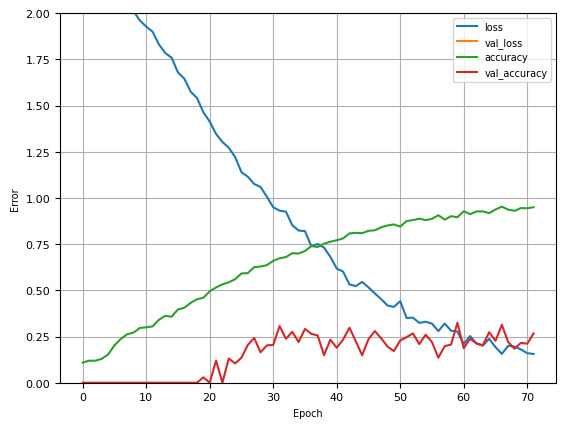

In [44]:
plot_loss(history)

In [38]:
optimal_epoch = early_stopping.best_epoch
stop_epoch = early_stopping.stopped_epoch
print(optimal_epoch)
print(stop_epoch)

66
71


In [45]:
model.load_weights('model_weights_60.h5')

# Saving model

In [19]:
export_path = '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/_Mos_arch_final_folder/model_final'

In [ ]:
model.save(export_path)
export_path

## Reloaded model

In [20]:
export_path = '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/_Mos_arch_final_folder/model_final'

In [21]:
reloaded = tf.keras.models.load_model(export_path)

In [22]:
model = reloaded
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 255, 255, 320)     4160      
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 320)     0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 126, 126, 320)     409920    
                                                                 
 dropout (Dropout)           (None, 126, 126, 320)     0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 63, 63, 320)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 62, 62, 320)       4

# Tests on outer images

In [28]:
test_path = '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped'
test_way_list = []
for address, dirs, files in os.walk(test_path):
    for name in files:
        test_way_list.append(os.path.join(address) + '/' + name)
test_way_list  
test_way_list = list(pd.Series(test_way_list).sort_values())
#del test_way_list[4]
print(len(test_way_list))
test_way_list

25


['/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/01_modern_piatygorsk.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/02_const_pyter_dk_ilicha.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/03_brut_boston_city_hall.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/04_palaty_suzdal.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/05_ampir_spb_dom_so_shpilem.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/06_ind_spb_erichssona.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/07_class_spb_senat.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/08_panelka_13_parkovaya_40_msk.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/09_xxi_spb_8grannik.jpg',
 '/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/croppe

In [29]:
probability_model = tf.keras.Sequential([model,
                                         tf.keras.layers.Softmax()])

/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/01_modern_piatygorsk.jpg


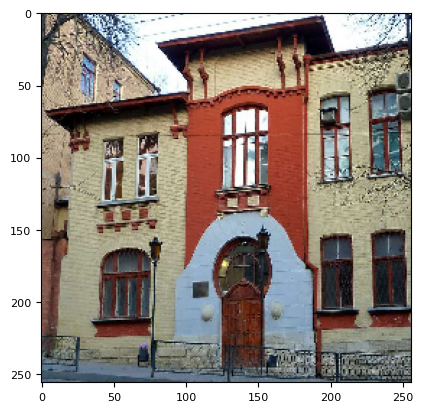

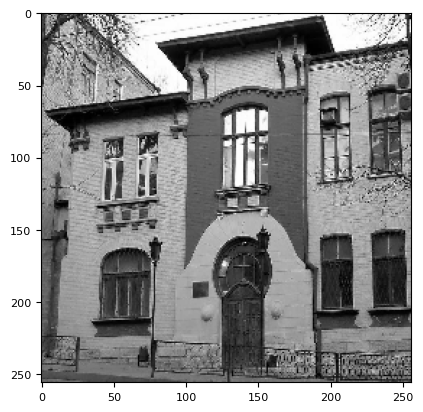

model_predict
1/1 [==============================] - 0s 85ms/step
[[9.9997496e-06 1.7862961e-04 1.2942534e-02 3.0920624e-03 3.2692310e-07
  7.9158120e-02 9.0161842e-01 1.5367864e-04 7.4358832e-06 2.8387296e-03
  1.8709063e-10]]
Modern 0.9
Industrial_XIX 0.08
Classicism 0.01

probability
1/1 [==============================] - 0s 81ms/step
[[0.07900471 0.07900744 0.07934912 0.07947055 0.07900387 0.08062536
  0.2070586  0.07901057 0.07900556 0.07946038 0.07900383]]
Modern 0.21
Industrial_XIX 0.08
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/02_const_pyter_dk_ilicha.jpg


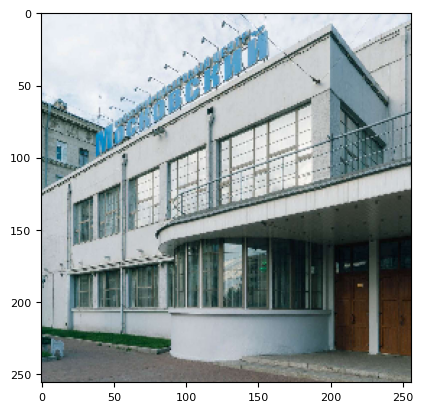

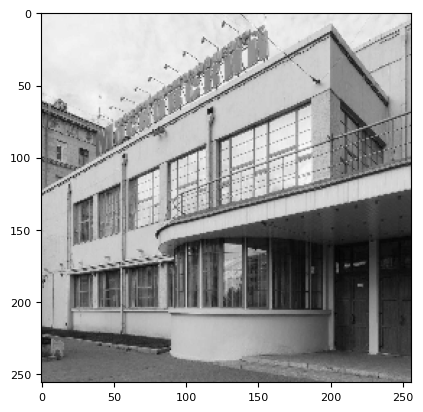

model_predict
1/1 [==============================] - 0s 109ms/step
[[3.7830640e-04 7.8725781e-09 1.6158683e-07 9.9937785e-01 2.6907478e-09
  2.8811764e-05 1.4202260e-04 1.3757498e-09 7.1190618e-05 1.7656616e-06
  4.3766850e-14]]
Constructivism 1.0
Brutalism 0.0
Modern 0.0

probability
1/1 [==============================] - 0s 79ms/step
[[0.08194278 0.0790652  0.07906529 0.20590925 0.0790652  0.07918856
  0.07916628 0.07906518 0.0793993  0.07906775 0.07906517]]
Constructivism 0.21
Brutalism 0.08
Panelka 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/03_brut_boston_city_hall.jpg


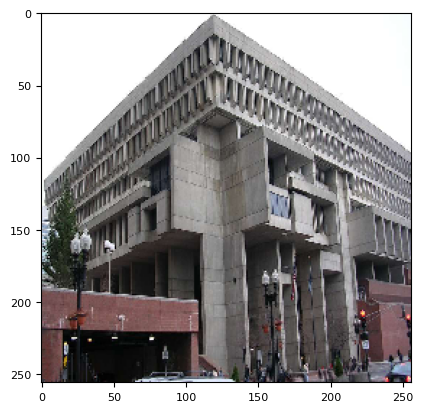

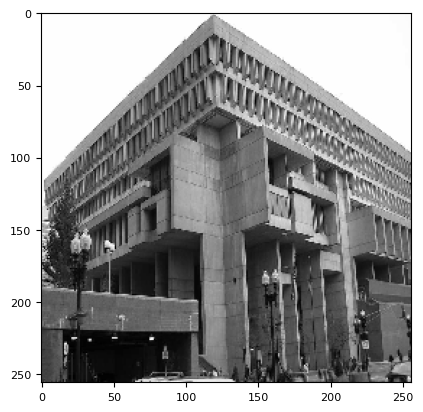

model_predict
1/1 [==============================] - 0s 88ms/step
[[9.1370940e-01 1.0979082e-05 3.5485550e-07 7.8168988e-02 3.2810730e-04
  7.7074081e-05 2.2739881e-05 2.9237705e-07 7.6794764e-03 2.6516827e-06
  7.5096540e-11]]
Brutalism 0.91
Constructivism 0.08
Panelka 0.01

probability
1/1 [==============================] - 0s 75ms/step
[[0.21295345 0.07867151 0.07867151 0.07874919 0.07867388 0.07867162
  0.07867151 0.07867151 0.07892279 0.07867151 0.07867151]]
Brutalism 0.21
Panelka 0.08
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/04_palaty_suzdal.jpg


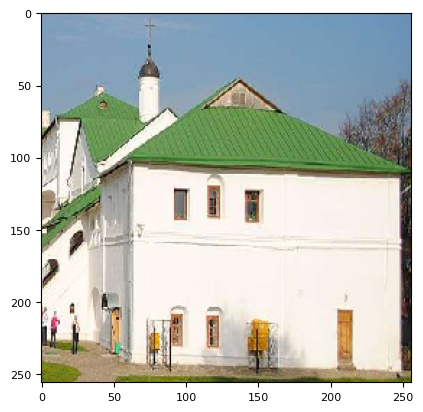

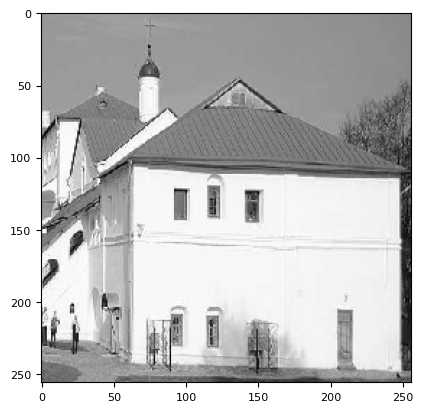

model_predict
1/1 [==============================] - 0s 77ms/step
[[2.9407283e-14 4.0111175e-08 3.2387547e-07 2.1766166e-13 1.8557261e-06
  3.0993146e-12 1.5449906e-12 9.9999774e-01 2.5486277e-17 2.0205868e-11
  1.1338856e-22]]
Palaty 1.0
Fortification 0.0
Classicism 0.0

probability
1/1 [==============================] - 0s 78ms/step
[[0.07862706 0.07862707 0.07862712 0.07862706 0.07862772 0.07862706
  0.07862706 0.21372862 0.07862706 0.07862706 0.07862706]]
Palaty 0.21
Fortification 0.08
Classicism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/05_ampir_spb_dom_so_shpilem.jpg


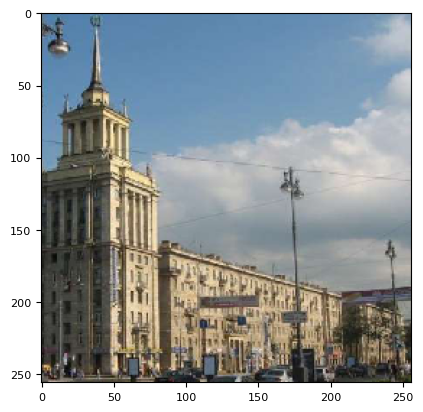

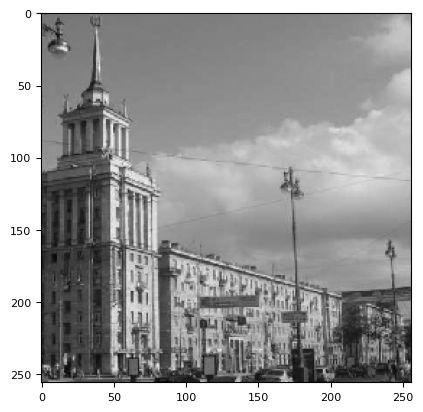

model_predict
1/1 [==============================] - 0s 93ms/step
[[6.1678897e-05 4.9079834e-03 2.2384798e-02 2.8097691e-04 2.2004728e-05
  3.8831597e-03 1.2868325e-03 2.9318420e-05 3.8221165e-06 9.6713948e-01
  2.6828788e-09]]
Socialist_classicism 0.97
Classicism 0.02
Church 0.0

probability
1/1 [==============================] - 0s 79ms/step
[[0.0787829  0.07881887 0.07940417 0.07881729 0.0787732  0.07905641
  0.07882803 0.07877279 0.07877307 0.21120198 0.07877132]]
Socialist_classicism 0.21
Classicism 0.08
Industrial_XIX 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/06_ind_spb_erichssona.jpg


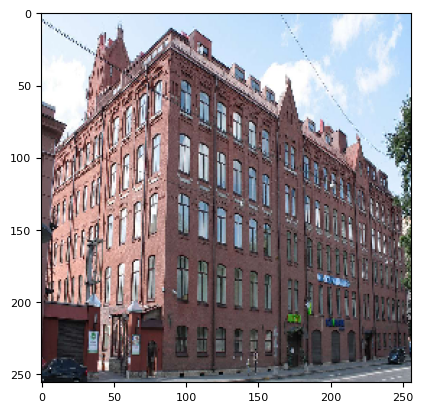

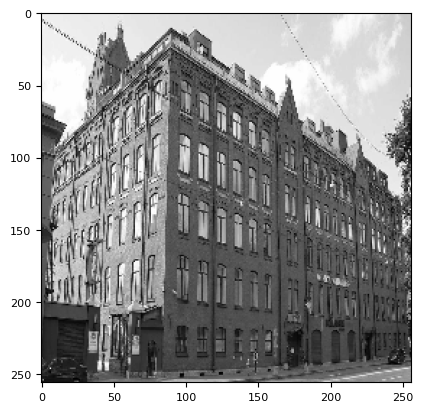

model_predict
1/1 [==============================] - 0s 105ms/step
[[5.4666129e-06 3.0005242e-07 7.5301532e-06 4.0453982e-05 7.2491645e-07
  9.9965811e-01 2.7023038e-04 3.8711669e-06 3.4744558e-06 9.7965503e-06
  6.8641390e-12]]
Industrial_XIX 1.0
Modern 0.0
Constructivism 0.0

probability
1/1 [==============================] - 0s 66ms/step
[[0.0787392  0.07873649 0.07874004 0.07880101 0.07873635 0.21181838
  0.0794558  0.07873701 0.0787456  0.07875396 0.07873616]]
Industrial_XIX 0.21
Modern 0.08
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/07_class_spb_senat.jpg


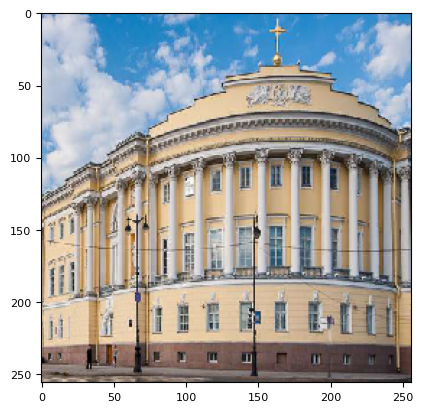

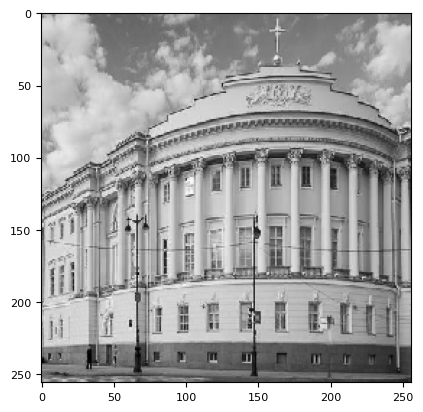

model_predict
1/1 [==============================] - 0s 97ms/step
[[1.5472400e-08 5.2447785e-08 9.7120506e-01 8.6518967e-06 2.6486252e-10
  6.3673101e-06 1.9184396e-03 2.1335963e-07 3.5035789e-08 2.6861031e-02
  3.6121970e-15]]
Classicism 0.97
Socialist_classicism 0.03
Modern 0.0

probability
1/1 [==============================] - 0s 77ms/step
[[0.08038472 0.08038475 0.17803486 0.08038789 0.08038471 0.08038865
  0.08109827 0.08038482 0.08038476 0.09778196 0.08038471]]
Classicism 0.18
Socialist_classicism 0.1
Modern 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/08_panelka_13_parkovaya_40_msk.jpg


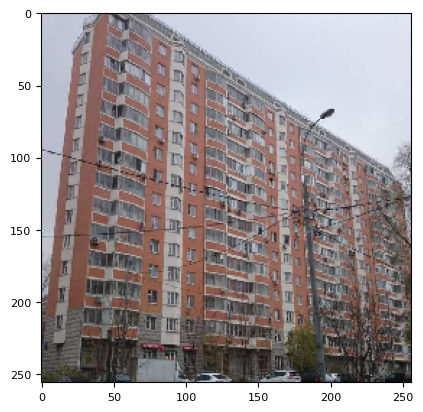

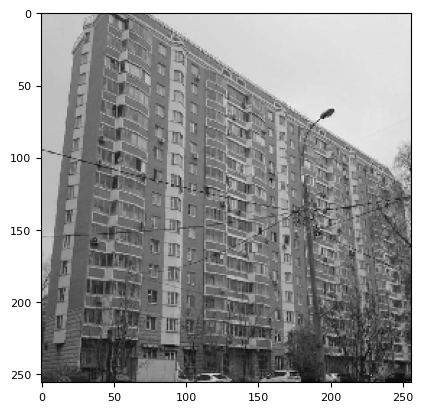

model_predict
1/1 [==============================] - 0s 100ms/step
[[2.5368416e-01 4.3410028e-06 1.1222322e-05 3.2154024e-02 1.5370808e-04
  1.8630076e-03 2.7881691e-04 3.7928819e-06 7.0901507e-01 2.8318858e-03
  8.1664409e-09]]
Panelka 0.71
Brutalism 0.25
Constructivism 0.03

probability
1/1 [==============================] - 0s 77ms/step
[[0.07876092 0.07864574 0.07864574 0.07866317 0.07864584 0.07864866
  0.07864665 0.07864574 0.21340331 0.07864846 0.07864574]]
Panelka 0.21
Brutalism 0.08
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/09_xxi_spb_8grannik.jpg


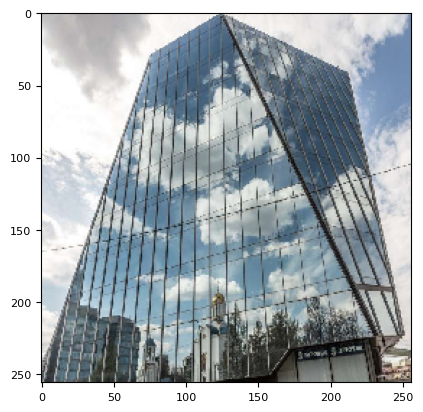

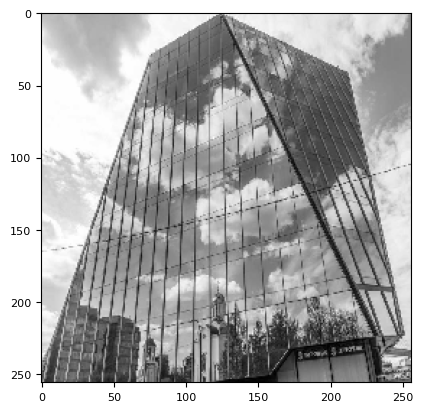

model_predict
1/1 [==============================] - 0s 91ms/step
[[5.1888347e-01 5.0926459e-04 6.6149211e-03 2.9684778e-02 3.9618583e-03
  9.0021268e-02 3.7862263e-03 6.1156932e-04 9.6847728e-02 2.4907462e-01
  4.3405730e-06]]
Brutalism 0.52
Socialist_classicism 0.25
Panelka 0.1

probability
1/1 [==============================] - 0s 79ms/step
[[0.13365969 0.08132926 0.08133192 0.08140317 0.0813433  0.08137893
  0.08133147 0.08133004 0.13416296 0.0814002  0.08132904]]
Panelka 0.13
Brutalism 0.13
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/10_church_uspenskiy_sobor_vladimir.jpg


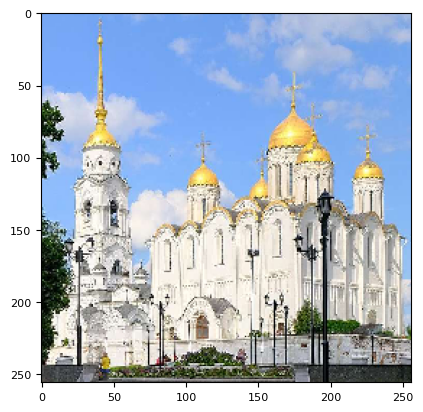

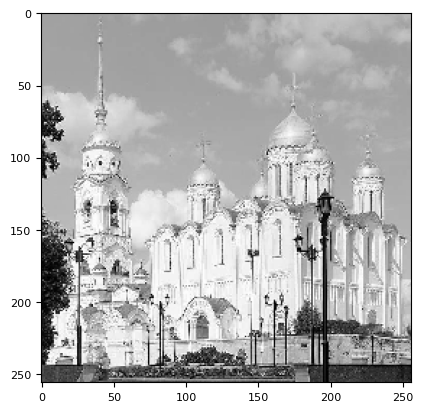

model_predict
1/1 [==============================] - 0s 91ms/step
[[8.6971078e-05 2.2982021e-03 7.3450685e-02 5.5574393e-04 2.9842471e-05
  1.8379962e-03 4.8423503e-03 1.4442655e-04 2.2762855e-05 9.1673106e-01
  3.7137337e-08]]
Socialist_classicism 0.92
Classicism 0.07
Modern 0.0

probability
1/1 [==============================] - 0s 76ms/step
[[0.08064131 0.08016591 0.08643735 0.08108481 0.08055776 0.08031259
  0.08004618 0.0804225  0.08014081 0.19030192 0.07988881]]
Socialist_classicism 0.19
Classicism 0.09
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/11_fortification_damasskskaya_tower_new_jerusalem.jpg


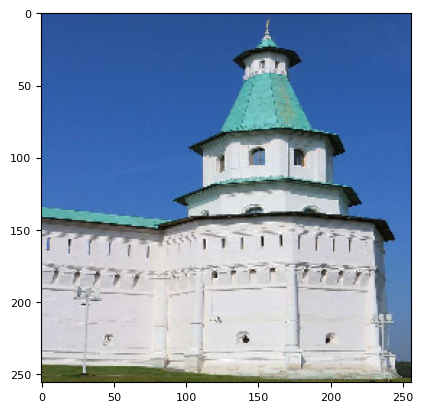

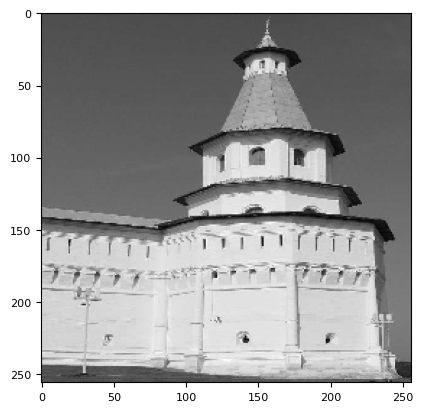

model_predict
1/1 [==============================] - 0s 105ms/step
[[2.7625326e-06 3.6976893e-02 2.0450594e-04 1.1091878e-05 9.6159106e-01
  3.1300699e-06 2.5518297e-08 1.1706657e-03 9.3470103e-09 3.9748480e-05
  1.1780201e-11]]
Fortification 0.96
Church 0.04
Palaty 0.0

probability
1/1 [==============================] - 0s 74ms/step
[[0.07867961 0.07892796 0.07868076 0.07867966 0.21281199 0.07867964
  0.07867961 0.07882187 0.07867961 0.07867969 0.07867961]]
Fortification 0.21
Church 0.08
Palaty 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/12_modern_zynger.jpg


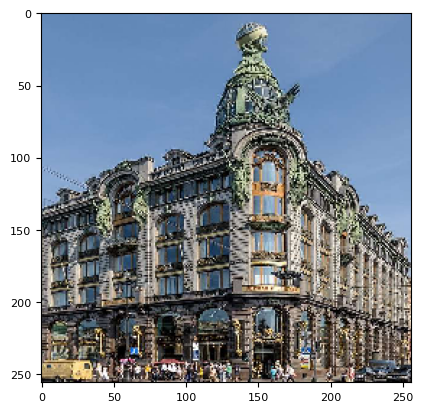

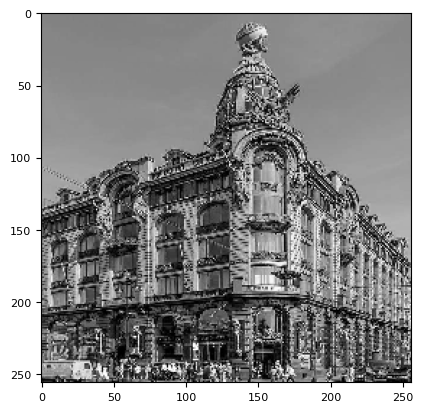

model_predict
1/1 [==============================] - 0s 75ms/step
[[8.8285201e-04 2.2342978e-02 1.7139170e-04 1.4425473e-03 6.4022732e-01
  3.2908779e-01 5.6240498e-04 2.1527176e-05 3.0215367e-06 5.2580703e-03
  9.1431210e-11]]
Fortification 0.64
Industrial_XIX 0.33
Church 0.02

probability
1/1 [==============================] - 0s 84ms/step
[[0.08180907 0.08280533 0.08158276 0.08314487 0.08154678 0.12701914
  0.13507728 0.08152301 0.08152958 0.08244284 0.08151933]]
Modern 0.14
Industrial_XIX 0.13
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/13_modern_spb_leihtenberskogo.jpg


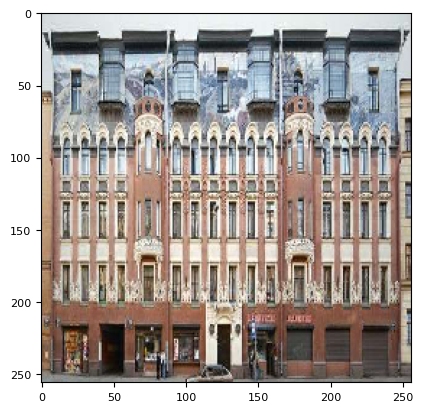

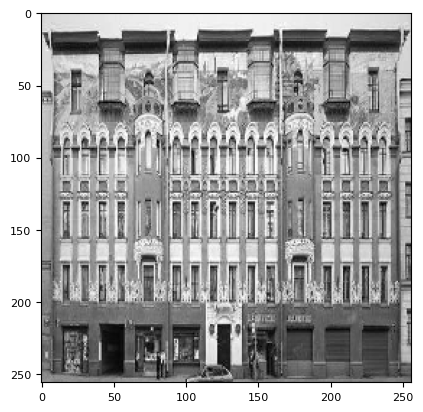

model_predict
1/1 [==============================] - 0s 107ms/step
[[1.3143991e-04 3.6346971e-04 3.8202894e-03 1.0681813e-02 1.4636335e-05
  3.9015543e-02 9.3717015e-01 2.5875107e-04 8.4971252e-04 7.6942244e-03
  6.8245583e-08]]
Modern 0.94
Industrial_XIX 0.04
Constructivism 0.01

probability
1/1 [==============================] - 0s 84ms/step
[[0.08028437 0.08025298 0.08030108 0.08163927 0.08023076 0.09107594
  0.18296579 0.08024558 0.08147787 0.08130145 0.08022492]]
Modern 0.18
Industrial_XIX 0.09
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/14_const_pyter_fk_vyborgskogo.jpg


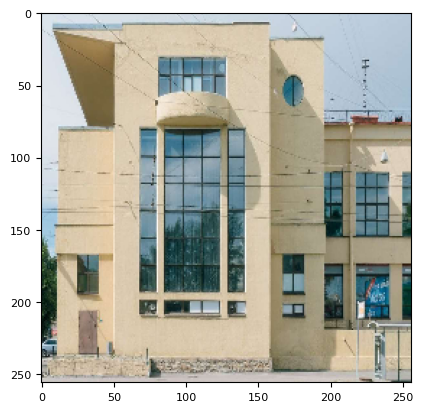

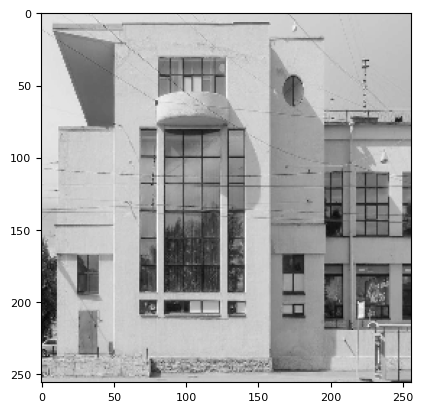

model_predict
1/1 [==============================] - 0s 92ms/step
[[3.7786447e-02 2.0733282e-03 3.2721895e-01 5.5633396e-01 3.2464802e-04
  6.1024288e-03 5.3020794e-02 1.0198065e-02 2.4740612e-03 4.4671516e-03
  2.6371214e-07]]
Constructivism 0.56
Classicism 0.33
Modern 0.05

probability
1/1 [==============================] - 0s 90ms/step
[[0.11814634 0.0821643  0.08248061 0.13856691 0.08220651 0.08263866
  0.08298045 0.08203355 0.08533983 0.08178899 0.08165381]]
Constructivism 0.14
Brutalism 0.12
Panelka 0.09
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/15_brut_london_theatre.jpg


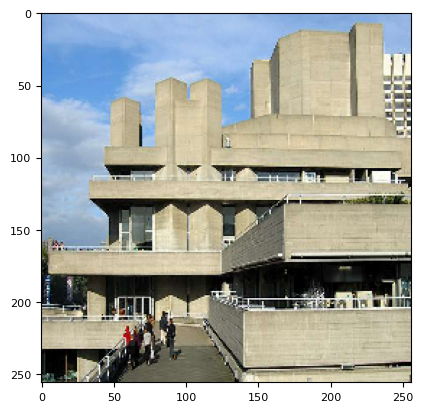

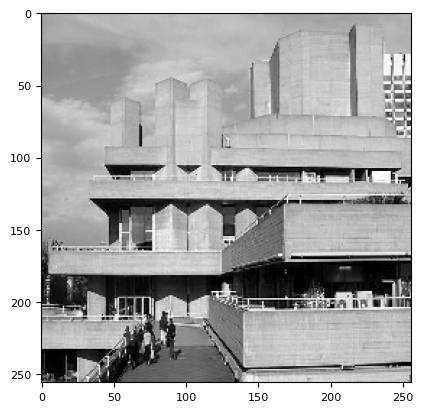

model_predict
1/1 [==============================] - 0s 121ms/step
[[9.8615289e-01 3.8046827e-10 8.1931033e-12 1.3846254e-02 1.9738370e-07
  4.3149271e-08 5.9384220e-11 1.2097143e-12 6.1146125e-07 2.4317039e-12
  4.3213912e-20]]
Brutalism 0.99
Constructivism 0.01
Panelka 0.0

probability
1/1 [==============================] - 0s 75ms/step
[[0.21346736 0.07864207 0.07864207 0.07875397 0.07864209 0.07864207
  0.07864207 0.07864207 0.07864215 0.07864207 0.07864207]]
Brutalism 0.21
Constructivism 0.08
Panelka 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/16_palaty_novgorod_1433.jpg


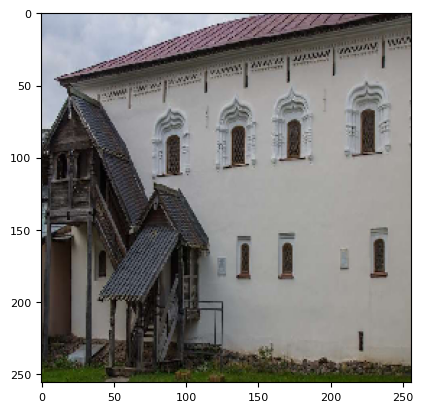

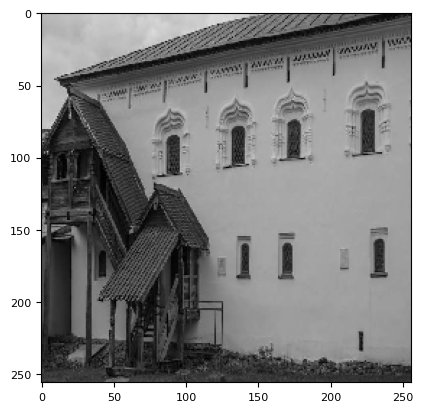

model_predict
1/1 [==============================] - 0s 97ms/step
[[2.3047761e-09 6.7730848e-06 2.9487655e-01 3.1500724e-07 4.0197724e-06
  2.3551769e-07 1.7464765e-06 7.0510364e-01 6.6552847e-11 6.7649312e-06
  5.9877479e-15]]
Palaty 0.71
Classicism 0.29
Church 0.0

probability
1/1 [==============================] - 0s 77ms/step
[[0.07872636 0.07872664 0.07946984 0.07872637 0.07872915 0.07872639
  0.07872639 0.2119897  0.07872636 0.07872643 0.07872636]]
Palaty 0.21
Classicism 0.08
Fortification 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/17_ampir_spb_cinema_druzhba.jpg


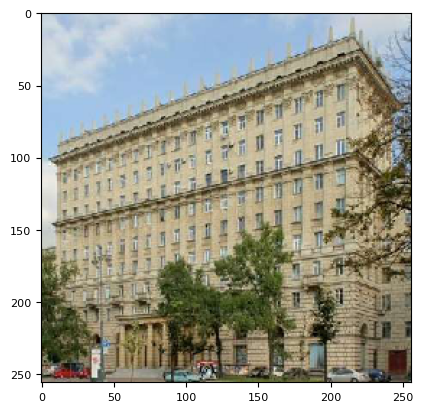

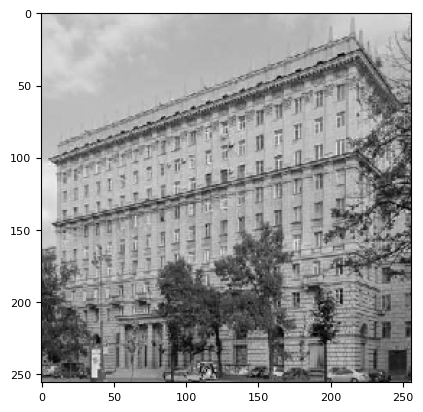

model_predict
1/1 [==============================] - 0s 108ms/step
[[8.7268359e-05 9.1494228e-05 9.0817899e-02 2.6637285e-03 1.5494730e-05
  9.8357266e-03 2.1121731e-02 3.5590111e-04 1.3214731e-04 8.7487859e-01
  2.7072772e-08]]
Socialist_classicism 0.87
Classicism 0.09
Modern 0.02

probability
1/1 [==============================] - 0s 78ms/step
[[0.08174199 0.08182051 0.11426332 0.08220603 0.08172707 0.08477167
  0.08780497 0.08252531 0.08179097 0.13964692 0.08170132]]
Socialist_classicism 0.14
Classicism 0.11
Modern 0.09
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/18_ind_spb_nissena.jpg


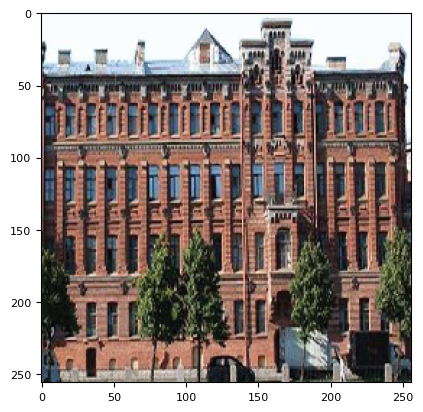

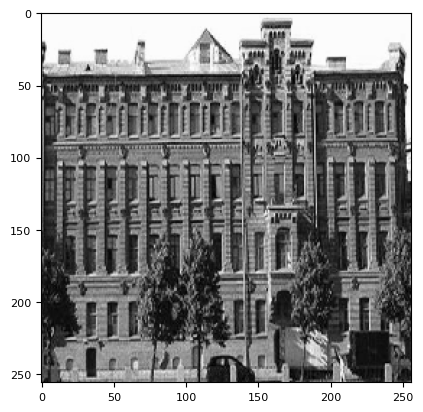

model_predict
1/1 [==============================] - 0s 113ms/step
[[1.3129158e-03 5.3791085e-04 2.0651589e-03 1.4840348e-02 6.0971448e-05
  5.5044943e-01 3.9294621e-01 3.6047562e-04 3.5766677e-03 3.3849649e-02
  2.8028188e-07]]
Industrial_XIX 0.55
Modern 0.39
Socialist_classicism 0.03

probability
1/1 [==============================] - 0s 79ms/step
[[0.08153094 0.08149718 0.08154678 0.0821281  0.08145437 0.12361214
  0.13988356 0.08147059 0.08190931 0.08351685 0.08145019]]
Modern 0.14
Industrial_XIX 0.12
Socialist_classicism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/19_class_spb_tavricheskiy.jpg


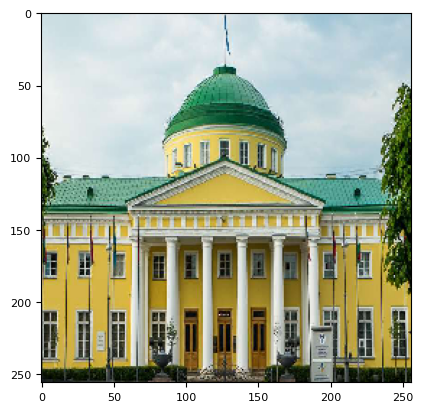

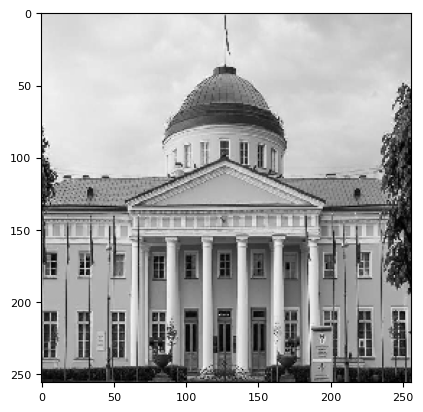

model_predict
1/1 [==============================] - 0s 96ms/step
[[4.33170610e-10 1.77706272e-04 9.83105361e-01 1.79328467e-07
  2.41842796e-10 5.84130203e-06 1.78093440e-04 4.56848355e-08
  1.13045004e-10 1.65327992e-02 9.67708143e-17]]
Classicism 0.98
Socialist_classicism 0.02
Modern 0.0

probability
1/1 [==============================] - 0s 100ms/step
[[0.07950587 0.07962511 0.19743007 0.07950602 0.07950587 0.07950836
  0.07954551 0.07950588 0.07950587 0.08685555 0.07950587]]
Classicism 0.2
Socialist_classicism 0.09
Church 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/20_panelka_15_parkovaya_42_msk.jpg


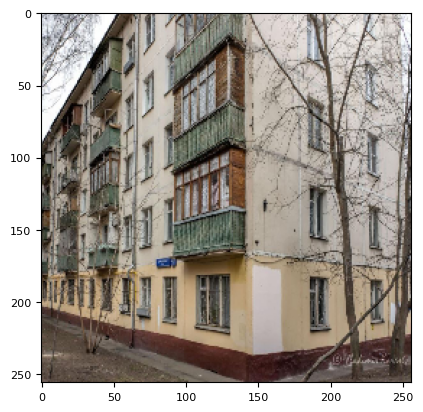

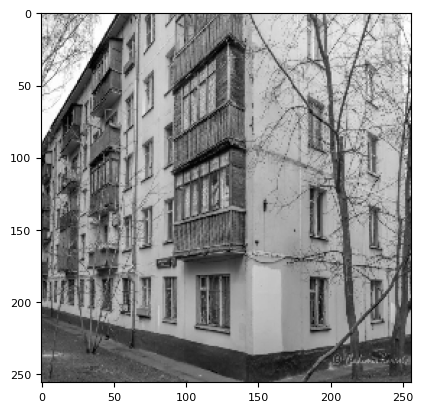

model_predict
1/1 [==============================] - 0s 106ms/step
[[7.2254433e-04 3.7293106e-02 1.5362781e-01 3.7188157e-02 6.1234296e-04
  6.4308725e-02 5.8158350e-01 1.0661947e-02 9.1858143e-03 1.0481208e-01
  4.0049122e-06]]
Modern 0.58
Classicism 0.15
Socialist_classicism 0.1

probability
1/1 [==============================] - 0s 74ms/step
[[0.08053496 0.08062112 0.08056029 0.08352596 0.08045175 0.08555365
  0.17897424 0.08047959 0.08712853 0.08172733 0.08044267]]
Modern 0.18
Panelka 0.09
Industrial_XIX 0.09
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/21_xxi_ekb_iset_tower.jpg


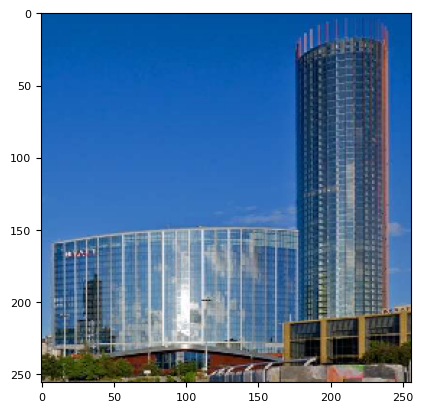

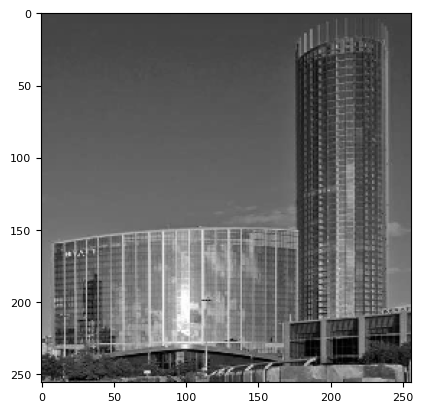

model_predict
1/1 [==============================] - 0s 116ms/step
[[3.4195036e-03 5.3901358e-06 1.6947453e-03 9.1940694e-04 1.0914573e-05
  9.8419259e-05 1.5919215e-05 2.7581680e-06 4.5850861e-04 9.9337441e-01
  3.3820793e-10]]
Socialist_classicism 0.99
Brutalism 0.0
Classicism 0.0

probability
1/1 [==============================] - 0s 75ms/step
[[0.07875344 0.07867834 0.07889206 0.07871899 0.07867847 0.07868157
  0.07867925 0.07867843 0.07872266 0.2128387  0.07867809]]
Socialist_classicism 0.21
Classicism 0.08
Brutalism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/22_church_uspenskiy_sobor_kolomna.jpg


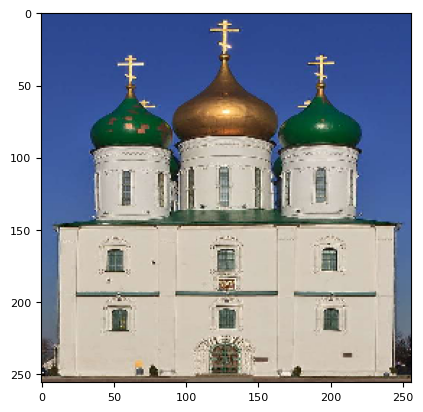

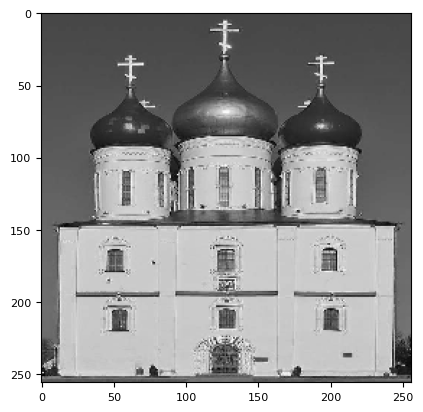

model_predict
1/1 [==============================] - 0s 116ms/step
[[6.9394571e-07 3.4439489e-03 8.9672925e-03 2.0022351e-06 5.8109133e-04
  4.8234424e-06 7.6729395e-07 9.8699784e-01 2.7239704e-09 1.5673648e-06
  7.6437207e-12]]
Palaty 0.99
Classicism 0.01
Church 0.0

probability
1/1 [==============================] - 0s 75ms/step
[[0.07863865 0.07864092 0.07864026 0.07863865 0.0787214  0.07863867
  0.07863865 0.2135268  0.07863865 0.07863865 0.07863865]]
Palaty 0.21
Fortification 0.08
Church 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/23_fortification_uglovaya_tower_iosifo-volockiy.jpg


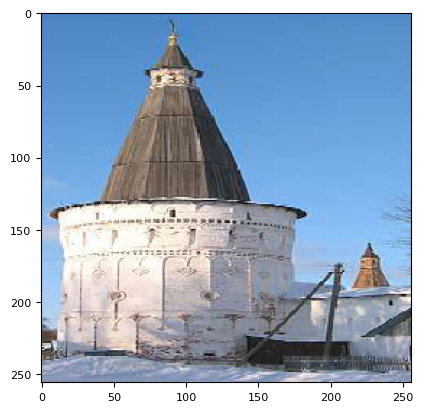

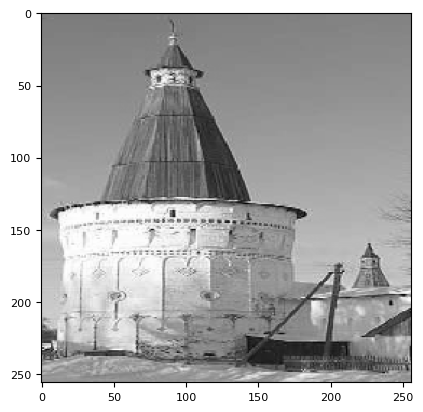

model_predict
1/1 [==============================] - 0s 120ms/step
[[1.18319772e-03 1.43942922e-01 1.25063285e-02 1.29171112e-03
  8.16817641e-01 1.94763462e-03 5.00085162e-06 2.22226027e-02
  4.43026374e-06 7.84283911e-05 1.24319319e-08]]
Fortification 0.82
Church 0.14
Palaty 0.02

probability
1/1 [==============================] - 0s 70ms/step
[[0.0789926  0.07974236 0.07900205 0.07898691 0.2076164  0.07899243
  0.0789722  0.08077827 0.07897223 0.07897237 0.07897216]]
Fortification 0.21
Palaty 0.08
Church 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/24_const_spb_kirov_raysovet.jpg


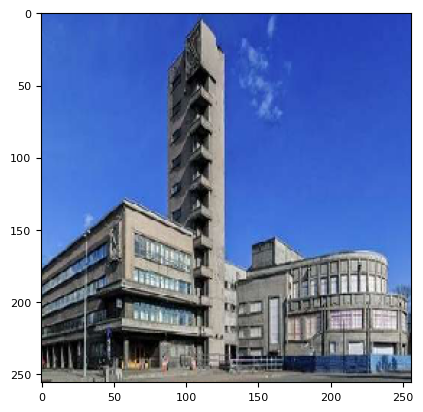

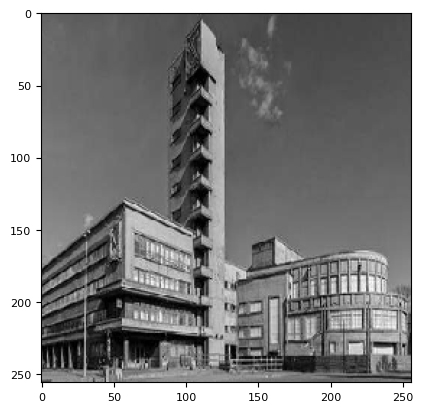

model_predict
1/1 [==============================] - 0s 117ms/step
[[5.13386309e-01 2.80175269e-01 6.82632672e-03 1.04356475e-01
  3.66432942e-03 1.69168096e-02 3.45809432e-03 2.20875008e-05
  5.19878697e-04 7.06744716e-02 5.99423267e-09]]
Brutalism 0.51
Church 0.28
Constructivism 0.1

probability
1/1 [==============================] - 0s 67ms/step
[[0.18225144 0.08900245 0.08041498 0.084024   0.08065178 0.08074567
  0.0803744  0.08027634 0.08036456 0.08161917 0.0802752 ]]
Brutalism 0.18
Church 0.09
Constructivism 0.08
/Users/vladkozlovskiy/Desktop/DATAS/_Architecture_CV/arch_tests/cropped/25_xxi_sochi_mandarin.jpg


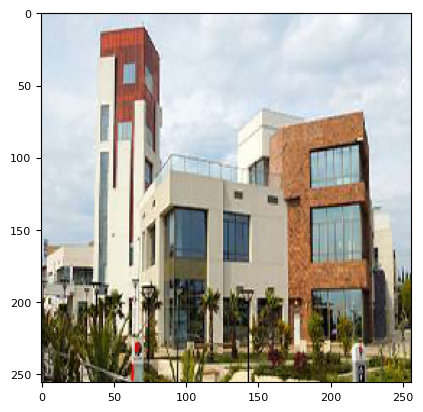

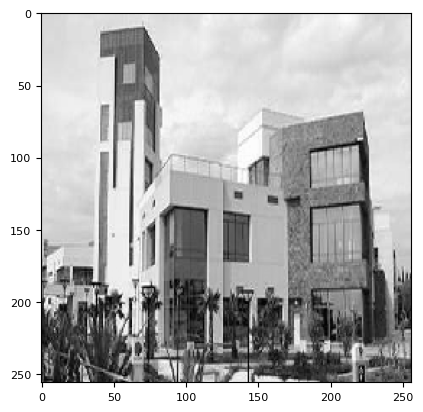

model_predict
1/1 [==============================] - 0s 110ms/step
[[9.8584241e-01 5.3329745e-07 3.0157510e-06 8.3118044e-03 6.4139276e-05
  5.6293904e-04 3.1303989e-06 1.9988900e-06 5.2004224e-03 9.5886990e-06
  8.4222518e-11]]
Brutalism 0.99
Constructivism 0.01
Panelka 0.01

probability
1/1 [==============================] - 0s 77ms/step
[[0.2122854  0.07870962 0.07870964 0.07880775 0.07871158 0.07871269
  0.07870964 0.07870965 0.07922462 0.07870977 0.07870962]]
Brutalism 0.21
Panelka 0.08
Constructivism 0.08


In [31]:
# grayscale
for i in test_way_list:
    print(i)
    img_path = i
    img = image.load_img(img_path, target_size=(img_height, img_width))
    plt.imshow(img)
    plt.show()
        
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    gray_img_array = tf.image.rgb_to_grayscale(img_array)
    gray_img_array = tf.image.grayscale_to_rgb(gray_img_array)
    gray_img_array = gray_img_array / 255.0
    
    # x = image.img_to_array(img)
    plt.imshow(gray_img_array)
    plt.show()
    x = np.expand_dims(gray_img_array, axis=0)
    #x = preprocess_input(x)
    
    print('model_predict')
    
    preds = model.predict(x)
    print(preds)
    for a in np.argsort(preds, axis=1)[:, -3:]:
        [print(class_names[x], np.round(preds[0][x],2)) for x in reversed(a)]
    print()

    print('probability')
    
    sample = Image.open(i).convert('L')
    sample = sample.resize((img_height, img_width))
    sample = sample.convert("RGB")
    #sample.show()
    sample = np.array(sample)
    sample = (np.expand_dims(sample,0))
    sample = sample / 255.0

    predictions_single = probability_model.predict(sample)
    print(predictions_single)
    for a in np.argsort(predictions_single, axis=1)[:, -3:]:
        [print(class_names[x], np.round(predictions_single[0][x],2)) for x in reversed(a)]